In [1]:
import numpy as np
import matplotlib.pyplot as plt
from cycler import cycler
import time
import os

from xpc.xscatter import Material, apply_psf, get_wavelen, get_wavenum

import jax
import jax.numpy as jnp
from jax.scipy.special import ndtr

import chromatix.functional as cx
from chromatix.ops import init_plane_resample

import dataclasses
from typing import Any

import optax
from jaxopt.projection import projection_non_negative
from flax import linen as nn
from flax.core import unfreeze, freeze

from skimage.metrics import structural_similarity as calc_ssim

import SimpleITK as sitk

In [2]:
def savefig(fname):
    plt.savefig(f'diss_figs/{fname}.png', bbox_inches='tight')

In [3]:
# Figure settings

from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar

def add_scalebar(ax, sz, Nx, real_dx, real_units, color='k', sv=1):
    width_px = sz * Nx 
    label = f'{real_dx * width_px:.0f} {real_units}'
    scalebar = AnchoredSizeBar(ax.transData, width_px, label, 'lower left', size_vertical=sv, frameon=False, color=color)
    ax.add_artist(scalebar)

cbcs = ['#0072B2', '#009E73', '#F0E442', '#D55E00', '#CC79A7']
custom_cycler = cycler('color', cbcs)  # color-blind friendly

plt.rcParams.update({
    'figure.dpi': 300,
    'font.size':10,
    'axes.titlesize':10,
    'axes.labelsize':8,
    'axes.linewidth': .5,
    'axes.prop_cycle': custom_cycler,
    'xtick.top': True, 
    'ytick.right': True, 
    'xtick.direction': 'in', 
    'ytick.direction': 'in',
    'xtick.labelsize':8,
    'ytick.labelsize':8,
    'legend.fontsize': 8,
    'lines.linewidth':1,
    'image.cmap':'gray',
    'text.usetex': True,
    'font.family': 'serif'
})


In [4]:
# Material definitions 

from xpc.xscatter import nist_mc, calc_mc, victre_matdict

air = Material('air', nist_mc['Air, Dry (near sea level)'], 0.0016)

adip = Material('adipose', nist_mc['Adipose Tissue (ICRU-44)'], 0.9)# 0.95)
gland = Material('gland', nist_mc['Breast Tissue (ICRU-44)'], 1.1)  # 1.05)
breast = Material('breast', nist_mc['Breast Tissue (ICRU-44)'], 1.0)
bone = Material('bone', nist_mc['Bone, Cortical (ICRU-44)'], 1.92)
tissue = Material('soft tissue', nist_mc['Tissue, Soft (ICRU-44)'], 1.06)

calc1 = Material('calcification - type I', calc_mc['Calcium Oxalate (Dihydrate)'], 2.0)
calc2 =  Material('calcification - type II', calc_mc['Hydroxyapatite'], 3.1)

cdte = Material('CdTe', nist_mc['Cadmium Telluride'], 6.2)
Si = Material('Si', 'Si(100.0)', 2.33)

In [5]:
# Class helpers

def gaussian_otf(Nx, dx, fwhm):
    fx = jnp.fft.fftfreq(Nx, d=dx)
    fy = jnp.fft.fftfreq(Nx, d=dx)
    FX, FY = jnp.meshgrid(fx, fy, indexing='ij')
    sigma = fwhm / (2 * jnp.sqrt(2 * jnp.log(2)))
    return jnp.exp(-2 * (jnp.pi**2) * sigma**2 * (FX**2 + FY**2))


def downsample_mean(x, factor):
    if factor == 1:
        return x
    Nx = (x.shape[0] // factor) * factor
    Ny = (x.shape[1] // factor) * factor
    x = x[:Nx, :Ny, ...]
    return x.reshape(Nx // factor, factor, Ny // factor, factor, *x.shape[2:]).mean(axis=(1, 3))


In [6]:
# Phantom helpers

def rotated_coords(X, Y, x0=0.0, y0=0.0, theta=0.0):
    ct = jnp.cos(theta)
    st = jnp.sin(theta)

    Xc = X - x0
    Yc = Y - y0

    Xr =  ct * Xc + st * Yc
    Yr = -st * Xc + ct * Yc

    return Xr, Yr


def ellipsoid_thickness(X, Y, x0=0.0, y0=0.0, a=0.2, b=0.1, theta=0.0, tmax=1.0):
    Xr, Yr = rotated_coords(X, Y, x0=x0, y0=y0, theta=theta)

    rho2 = (Xr / a)**2 + (Yr / b)**2
    inside = rho2 <= 1.0

    return tmax * jnp.where(inside, jnp.sqrt(jnp.clip(1.0 - rho2, 0.0)), 0.0)


def add_ellipsoids(X, Y, ellipsoids):
    tmap = jnp.zeros_like(X)

    for e in ellipsoids:
        tmap = tmap + ellipsoid_thickness(X, Y, **e)

    return tmap

### 
def cylinder_tmap(X, Y, tmax=1.0, x0=0.0):
    FOV = jnp.max(X) - jnp.min(X)
    radius = 0.4 * FOV

    rho2 = ((X - x0) / radius)**2
    inside = rho2 <= 1.0

    return tmax * jnp.where(inside, jnp.sqrt(jnp.clip(1.0 - rho2, 0.0)), 0.0)


def ellipsoids_tmap(X, Y, tmax=1.0, N=4, y=0.0, v=2.0, h=0.5, a_min=0.5, a_max=1):
    FOV = jnp.max(X) - jnp.min(X)
    
    pars = {
        'y0': -y * FOV,
        'theta': 0.0, 
    }
    scales = np.linspace(a_min, a_max, N)[::-1]
    
    x0s = FOV * np.linspace(-h, h, N) / 2.0
    a0s = (0.5 * FOV / (2 * N)) * scales
    ts =  tmax * scales

    ellipsoids = [
        dict(x0=x, a=a, b=v*a, tmax=t, **pars) for (x, a, t) in zip(x0s, a0s, ts)
    ]

    tmap = add_ellipsoids(X, Y, ellipsoids)
    cyl_mask = cylinder_tmap(X, Y, tmax=1.0) > 0

    return jnp.where(cyl_mask, tmap, 0.0)


########################
### Testing:
    
# x = np.linspace(-1, 1, 1024)
# X, Y = np.meshgrid(x, x)

########################
### Old:

# tmap1 = add_ellipsoids(
#     X, Y, [dict(
#         x0=0.1, y0=-0.05, a=0.75, b=0.55, theta=np.deg2rad(55), tmax=3e-3
#     )]
# )
# tmap2 = add_ellipsoids(
#     X, Y, [dict(
#         x0=-0.2, y0=0.1, a=0.6, b=0.4, theta=np.deg2rad(-25), tmax=0.5e-3
#     )]
# )

########################
### New:
    
# tmap_cyl = cylinder_tmap(X, Y, tmax=3e-3)
# tmap_ell = ellipsoids_tmap(X, Y, tmax=1e-3) 

# fig, ax = plt.subplots(1, 3, figsize=[10,2])
# for i, tmap in enumerate([tmap_cyl, tmap_ell, tmap_cyl+tmap_ell]):
#     m = ax[i].imshow(1e3*tmap); fig.colorbar(m, ax=ax[i])
# plt.show()

In [7]:
# FOMs -- (NLL, RMSE)
def calc_nll(y, data):
    return jnp.mean(y - data*jnp.log(y))

def calc_rmse(y, data):
    return jnp.sqrt(jnp.mean((y - data)**2))

def calc_rmse_roi(y, data, b1=10, b2=-10, c1=128-80, c2=128+80):
    return calc_rmse(y[c1:c2, b1:b2], data[c1:c2, b1:b2])

In [8]:
# 2D PSF 

def gaussian2D(x, y, fwhm, normalize=True):
    """
    Generate a 2D Gaussian kernel.
    x, y : 1D arrays
        Grid coordinates [arbitrary length]
    fwhm : float
        Full-width at half-max of the Gaussian (units must match x,y)
    normalize: bool (default True)
        If True, normalize the kernel to sum to 1
    """
    sigma = fwhm / (2 * jnp.sqrt(2 * jnp.log(2)))
    X, Y = jnp.meshgrid(x, y)
    kernel = jnp.exp(-(X**2 + Y**2) / (2 * sigma**2))
    if normalize:
        kernel = kernel / jnp.sum(kernel)
    return kernel
    
    
def lorentzian2D(x, y, fwhm, normalize=True):
    """
    Generate a 2D Lorentzian kernel.
    x, y : 1D arrays
        Grid coordinates [arbitrary length]
    fwhm : float
        Full-width at half-max of the Lorentzian (units must match x,y)
    normalize: bool (default True)
        If True, normalize the kernel to sum to 1
    """
    gamma = fwhm/2
    X, Y = jnp.meshgrid(x, y)
    kernel = gamma / (2 * PI * (X**2 + Y**2 + gamma**2)**1.5)
    if normalize:
        kernel = kernel / jnp.sum(kernel)
    return kernel


def convolve2d_diy(img, kernel):
    """Convolve two 2D arrays with scipy-like mode='same'."""
    H, W = img.shape
    KH, KW = kernel.shape
    F = jnp.fft.rfft2(img, s=(H+KH-1, W+KW-1))
    G = jnp.fft.rfft2(kernel, s=(H+KH-1, W+KW-1))
    out = jnp.fft.irfft2(F * G, s=(H+KH-1, W+KW-1))
    oh, ow = (KH-1)//2, (KW-1)//2   # center crop (mode='same')
    return out[oh:oh+H, ow:ow+W]
    

def apply_psf_2d(img, FOV=None, dx=1, fwhm=None, kernel_width=1, psf='gaussian'):
    """ Apply a PSF to an image."""

    # Check special condition
    if fwhm is None:
        return img

    if FOV is None:
        FOV = img.shape[0]
        
    # Check if PSF format is supported
    psf = psf.lower()
    assert psf in ('lorentzian', 'gaussian')

    # Compute the reduced FOV for kernel grid, for efficiency
    small_FOV = kernel_width * FOV   # reduce kernel size to improve convolution time
    x = jnp.arange(-small_FOV, small_FOV, dx) + dx

    # Generate the kernel (normalized by default)
    if psf == 'lorentzian':
        kernel = lorentzian2D(x, x, fwhm)
    elif psf == 'gaussian':
        kernel = gaussian2D(x, x, fwhm)
        
    img_pad = jnp.pad(img, kernel.shape, constant_values=img[0,0])    # pad img to account for fillvalue = 0. Corner [0,0] pixel might be bad idea?
    img_nonideal_pad = convolve2d_diy(img_pad, kernel)
    img_nonideal = img_nonideal_pad[kernel.shape[0]:-kernel.shape[0], kernel.shape[1]:-kernel.shape[1]]
        
    return img_nonideal


In [9]:
# Noise
def add_noise_to_data(imgs, I0_per_px, key=jax.random.PRNGKey(3)):
    return jax.random.poisson(key, I0_per_px*imgs, imgs.shape) / I0_per_px

In [10]:
# Init material decomp (Schaff)

def schaff_spbi(
    basis_mats,
    sim_model,
    data,
    data_are_counts=False,
    lsq_weights=None,
    clip_negative=True,
    apply_adjust_delta=False,
    rcond=1e-8,
    eps=1e-8,
    return_info=False,
    propdist=None,
    ridge=0.0,
):
    """
    Schaff spectral PBI material decomposition.

    Parameters
    ----------
    basis_mats : tuple
        Two basis material objects, e.g. (tissue, bone).
        Each must have .delta_beta_jnp(energies).

    sim_model : SpectralPBI
        Simulation model with spectrum, etas, I0_total, propdist, n_medium,
        and either dx_det or dx/upsample_factor.

    data : array
        Raw detector-bin images with shape (Nx, Ny, N_bins).
        By default, this assumes flat-field-normalized data, matching the
        output of your SpectralPBI model.

    data_are_counts : bool
        If True, divide by flat-field bin counts before decomposition.

    lsq_weights : None, str, or array
        Optional scalar weight per detector bin for overdetermined LS.
        None -> unweighted.
        'flat' -> weight by flat-field bin counts.
        array -> custom weights of shape (N_bins,).

    clip_negative : bool
        If True, clip recovered material thickness maps to >= 0.

    apply_adjust_delta : bool
        Optional Schaff-style delta stabilization for 2-bin/2-material case.

    rcond : float
        Pseudoinverse cutoff for the frequency-wise LS solve.

    eps : float
        Small floor to avoid log(0).

    return_info : bool
        If True, return (tmap, info).

    Returns
    -------
    tmap : jnp.ndarray
        Recovered material thickness maps with shape (2, Nx, Ny).
    """

    import numpy as np
    import jax
    import jax.numpy as jnp

    if len(basis_mats) != 2:
        raise ValueError('basis_mats must contain exactly two materials.')

    y = np.asarray(jax.device_get(data), dtype=np.float64)

    if y.ndim == 2:
        y = y[:, :, None]

    if y.ndim != 3:
        raise ValueError('data must have shape (Nx, Ny, N_bins).')

    Nx, Ny, N_bins = y.shape

    spectrum = np.asarray(jax.device_get(sim_model.spectrum), dtype=np.float64)
    etas = np.asarray(jax.device_get(sim_model.etas), dtype=np.float64)

    if etas.ndim == 1:
        etas = etas[None, :]

    energies = spectrum[0]
    counts = spectrum[1]

    if etas.shape[0] != N_bins:
        raise ValueError(
            f'data has {N_bins} bins, but etas has {etas.shape[0]} bins.'
        )

    if N_bins < 2:
        raise ValueError('Need at least two spectral measurements for two-material decomposition.')

    if hasattr(sim_model, 'dx_det'):
        px = sim_model.dx_det
    else:
        px = sim_model.dx * sim_model.upsample_factor

    weights_E = counts / np.sum(counts)
    I0s = sim_model.I0_total * weights_E
    flat_bins = np.einsum('ce,e->c', etas, I0s)

    if data_are_counts:
        y = y / (flat_bins[None, None, :] + eps)

    y = np.clip(y, eps, None)

    bin_weights = etas * I0s[None, :]
    bin_weights = bin_weights / (np.sum(bin_weights, axis=1, keepdims=True) + eps)

    wavelens = np.asarray(
        jax.device_get(get_wavelen(jnp.asarray(energies))),
        dtype=np.float64,
    ) / sim_model.n_medium

    ks = 2 * np.pi / wavelens

    ds_E = []
    mus_E = []

    for mat in basis_mats:
        d, b = mat.delta_beta_jnp(jnp.asarray(energies))

        d = np.asarray(jax.device_get(d), dtype=np.float64)
        b = np.asarray(jax.device_get(b), dtype=np.float64)

        mu = 2 * ks * b

        ds_E.append(d)
        mus_E.append(mu)

    ds_E = np.stack(ds_E, axis=0)      # (B, Ne)
    mus_E = np.stack(mus_E, axis=0)    # (B, Ne)

    ds_eff = np.einsum('ce,be->cb', bin_weights, ds_E)
    mus_eff = np.einsum('ce,be->cb', bin_weights, mus_E)

    eff_energies = np.einsum('ce,e->c', bin_weights, energies)

    def _test_sign(ds, mus):
        const_term = mus[1, 1] * mus[0, 0] - mus[1, 0] * mus[0, 1]
        k2_term = (
            mus[1, 1] * ds[0, 0]
            + mus[0, 0] * ds[1, 1]
            - mus[1, 0] * ds[0, 1]
            - mus[0, 1] * ds[1, 0]
        )
        k4_term = ds[1, 1] * ds[0, 0] - ds[1, 0] * ds[0, 1]
        return np.sign(const_term), np.sign(k2_term), np.sign(k4_term)

    if apply_adjust_delta and ds_eff.shape == (2, 2):
        signs = np.asarray(_test_sign(ds_eff, mus_eff))
        if np.prod(signs[[0, -1]]) == -1:
            print('Delta and mu term signs do not match; applying Schaff-style delta scaling.')
            ds_eff = np.outer(eff_energies[0]**2 / eff_energies**2, ds_eff[0])

    fx = np.fft.fftfreq(Nx, px)
    fy = np.fft.fftfreq(Ny, px)
    f2 = np.add.outer(fx**2, fy**2)

    if propdist is None:
        propdist = sim_model.propdist
    distances = np.full(N_bins, propdist, dtype=np.float64)

    A = (
        mus_eff[:, :, None, None]
        + 4 * np.pi**2 * distances[:, None, None, None] * ds_eff[:, :, None, None] * f2[None, None, :, :]
    )                                              # (C, B, Nx, Ny)

    A = np.moveaxis(A, [0, 1], [2, 3])              # (Nx, Ny, C, B)

    b = np.fft.fftn(-np.log(np.moveaxis(y, -1, 0)), axes=(1, 2))
    b = np.moveaxis(b, 0, -1)                       # (Nx, Ny, C)

    if lsq_weights is None:
        w = np.ones(N_bins, dtype=np.float64)
    elif isinstance(lsq_weights, str):
        if lsq_weights == 'flat':
            w = flat_bins / (np.mean(flat_bins) + eps)
        else:
            raise ValueError("lsq_weights must be None, 'flat', or an array.")
    else:
        w = np.asarray(lsq_weights, dtype=np.float64)

    if w.shape != (N_bins,):
        raise ValueError(f'lsq_weights must have shape {(N_bins,)}.')

    sw = np.sqrt(w)

    Aw = A * sw[None, None, :, None]
    bw = b * sw[None, None, :]

    ATA = np.einsum('xycb,xycd->xybd', Aw, Aw)
    ATb = np.einsum('xycb,xyc->xyb', Aw, bw)

    # Insert: ridge reg
    if ridge > 0:
        B = ATA.shape[-1]
        eye = np.eye(B, dtype=ATA.dtype)[None, None, :, :]
    
        scale = np.mean(
            np.trace(ATA, axis1=-2, axis2=-1)
        ) / B
    
        ATA = ATA + ridge * scale * eye
    # End: ridge reg
    
    iATA = np.linalg.pinv(ATA, rcond=rcond)
    xF = np.einsum('xybd,xyd->xyb', iATA, ATb)

    tmap = np.real(np.fft.ifftn(xF, axes=(0, 1)))
    tmap = np.moveaxis(tmap, -1, 0)

    if clip_negative:
        tmap = np.maximum(tmap, 0.0)

    tmap = jnp.asarray(tmap, dtype=jnp.float32)

    if return_info:
        info = dict(
            ds_eff=ds_eff,
            mus_eff=mus_eff,
            ds_E=ds_E,
            mus_E=mus_E,
            energies=energies,
            eff_energies=eff_energies,
            bin_weights=bin_weights,
            flat_bins=flat_bins,
            A_shape=A.shape,
            lsq_weights=w,
            px=px,
        )

        return tmap, info

    return tmap

In [11]:
# Bin eta makers

def split_spectrum_gaussian(energies, IE, E_thresh, gap_keV=0.0, fwhm_keV=0.0):
    E_thresh = jnp.atleast_1d(E_thresh)
    energies = jnp.asarray(energies)
    IE = jnp.asarray(IE)
    sigma = jnp.asarray(fwhm_keV / 2.355)

    E_lo = E_thresh[..., None] - 0.5 * gap_keV
    E_hi = E_thresh[..., None] + 0.5 * gap_keV
    z_lo = (E_lo - energies[None, :]) / sigma
    z_hi = (E_hi - energies[None, :]) / sigma
    c_lo = ndtr(z_lo)   # P(meas < E_lo | true E)
    c_hi = ndtr(z_hi)   # P(meas < E_hi | true E)

    w_low = c_lo
    w_high = 1.0 - c_hi

    s_low = w_low * IE[None, :]
    s_high = w_high * IE[None, :]

    return s_low[0], s_high[0]
    
def split_spectrum(energies, Et, gap_keV=0.0, fwhm_keV=0.0):
    counts = jnp.ones(energies.size)
    return split_spectrum_gaussian(energies, counts, Et, gap_keV, fwhm_keV)

def split_spectrum_multi(energies, thresholds, gap=0.0, fwhm=0.0):
    thresholds = sorted(jnp.atleast_1d(thresholds))
    etas = []
    envelope = jnp.ones(energies.size)
    for Et in thresholds:
        eta_lo, eta_hi = split_spectrum(energies, Et, gap, fwhm)
        etas.append(eta_lo * envelope)
        envelope = eta_hi
    etas.append(envelope)
    return jnp.array(etas)

def filter_etas(etas, eta_det):
    return etas * eta_det[None,:]

# Spectrum

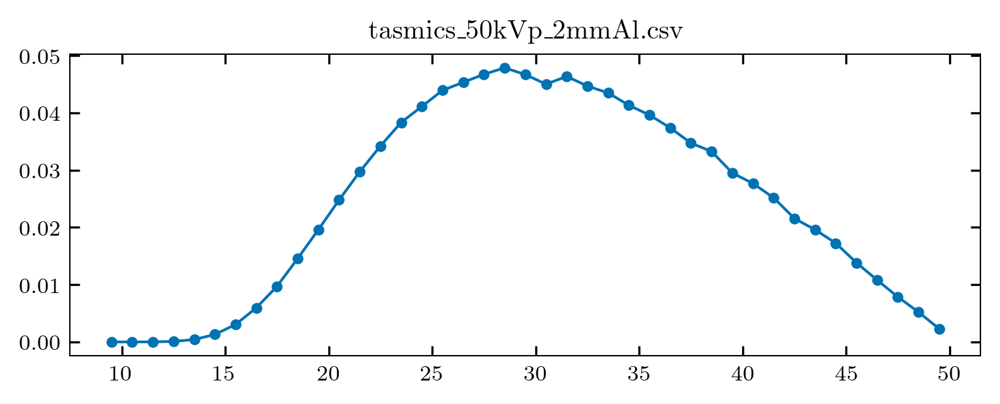

total efficiency: 0.26224962


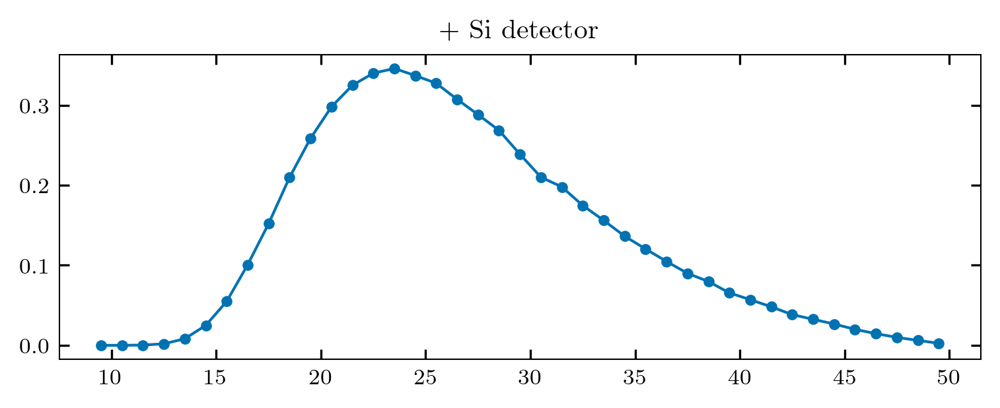

In [12]:
# Load spectrum
fname = 'tasmics_50kVp_2mmAl.csv'
with open('../inputs/spectrum/'+fname, 'r') as f:
    spectrum = np.array([line.split(',') for line in f.readlines()[1:]], dtype=float).T
    spectrum[1] /= np.sum(spectrum[1])          # normalize total counts
    spectrum = spectrum[:, spectrum[1] > 1e-9 ]  # remove 0s for speed

# Jax-ify
spectrum = jnp.asarray(spectrum, dtype=jnp.float32)
eta_0 = jnp.ones((1, spectrum.shape[1]), dtype=jnp.float32)
thresh = 18.0
eta_1 = jnp.where(spectrum[0] < thresh, 1.0, 0.0)
eta_2 = jnp.where(spectrum[0] >= thresh, 1.0, 0.0)

# Show
fig, ax = plt.subplots(1, 1, figsize=[6,2])
ax.set_title(fname)
ax.plot(spectrum[0], spectrum[1], '.-')
plt.show()

# Make matching detector efficiency
mat_det, T_det = Si, 1e-3
_, b_det = mat_det.delta_beta(spectrum[0])
mu_det = 2 * b_det * get_wavenum(spectrum[0])
eta_det = 1 - jnp.exp(-mu_det * T_det)

print('total efficiency:', np.sum(spectrum[1]*eta_det))
fig, ax = plt.subplots(1, 1, figsize=[6,2])
ax.set_title(f'+ {mat_det.name} detector')
ax.plot(spectrum[0], eta_det*spectrum[1]/spectrum[1].max(), '.-')
plt.show()

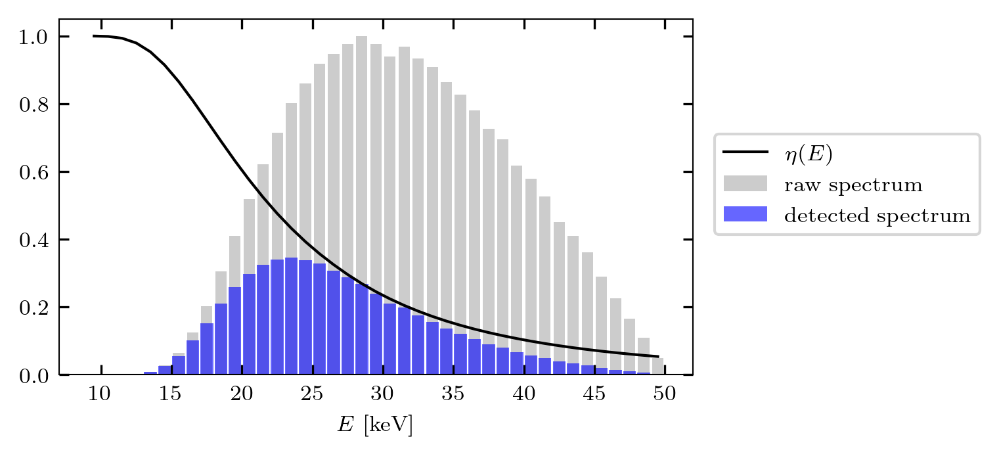

In [13]:
# Make fig

fig, ax = plt.subplots(1, 1, figsize=[3.5,2.2], layout='constrained')
ax.set_xlabel('$E$ [keV]')
ax.bar(spectrum[0], spectrum[1]/spectrum[1].max(), color='gray', alpha=0.4, label='raw spectrum')
ax.plot(spectrum[0], eta_det,'k-', label=r'$\eta(E)$')
ax.bar(spectrum[0], eta_det*spectrum[1]/spectrum[1].max(), color='b', width=0.9, alpha=0.6, label='detected spectrum')
fig.legend(loc='center right', bbox_to_anchor=(1.42,0.6))
# savefig('spectrum')
plt.show()

# Simulation class

In [14]:
class SpectralPBI(nn.Module):

    propdist: float = 50e-2
    I0_total: float = 1e5

    dx_det: float = 20e-6
    Nx_det: int = 128

    mats: Any = dataclasses.field(default_factory=lambda: (tissue,))
    init_tmap: Any = None

    param_upsample_factor: int = 1
    wave_upsample_factor: int = 2

    N_pad: int = 0
    n_medium: float = 1.0

    spectrum: Any = None
    etas: Any = None

    psf_fwhm: float | None = 10e-6
    return_energy_resolved: bool = False

    def setup(self):
        if self.spectrum is None:
            raise ValueError('spectrum must have shape [2, Ne].')
        if self.etas is None:
            raise ValueError('etas must have shape [Ne] or [N_bins, Ne].')
        if self.wave_upsample_factor % self.param_upsample_factor != 0:
            raise ValueError('wave_upsample_factor must be divisible by param_upsample_factor.')

        B = len(self.mats)

        self.Nx_param = self.Nx_det * self.param_upsample_factor
        self.dx_param = self.dx_det / self.param_upsample_factor

        self.Nx_wave = self.Nx_det * self.wave_upsample_factor
        self.dx_wave = self.dx_det / self.wave_upsample_factor

        if self.init_tmap is None:
            tmap_init = lambda key, shape: jnp.full(shape, 1e-9, dtype=jnp.float32)
        else:
            init_tmap = jnp.asarray(self.init_tmap, dtype=jnp.float32)
            if init_tmap.shape != (B, self.Nx_param, self.Nx_param):
                raise ValueError(f'init_tmap must have shape {(B, self.Nx_param, self.Nx_param)}.')
            tmap_init = lambda key, shape: init_tmap

        self.tmap = self.param(
            'tmap',
            tmap_init,
            (B, self.Nx_param, self.Nx_param),
        )

        spectrum = jnp.asarray(self.spectrum, dtype=jnp.float32)
        etas = jnp.asarray(self.etas, dtype=jnp.float32)

        if etas.ndim == 1:
            etas = etas[None, :]

        energies = spectrum[0]
        counts = spectrum[1]
        weights = counts / jnp.sum(counts)

        self.energies = energies
        self.I0s = self.I0_total * weights
        self.etas_arr = etas
        self.flat_bins = jnp.einsum('ce,e->c', self.etas_arr, self.I0s)

        dbs = [m.delta_beta_jnp(energies) for m in self.mats]
        self.ds = jnp.stack([d for d, _ in dbs], axis=0).astype(jnp.float32)
        self.bs = jnp.stack([b for _, b in dbs], axis=0).astype(jnp.float32)

        self.wavelens = get_wavelen(self.energies) / self.n_medium
        self.ks = 2 * jnp.pi / self.wavelens

        N_prop = self.Nx_wave + 2 * self.N_pad

        fx = jnp.fft.fftfreq(N_prop, d=self.dx_wave)
        fy = jnp.fft.fftfreq(N_prop, d=self.dx_wave)
        FX, FY = jnp.meshgrid(fx, fy, indexing='ij')
        f2 = FX**2 + FY**2

        self.H = jnp.exp(
            -1j * jnp.pi * self.wavelens[None, None, :] * self.propdist * f2[:, :, None]
        ).astype(jnp.complex64)

        if self.psf_fwhm is None or self.psf_fwhm <= 0:
            self.psf_otf = None
        else:
            self.psf_otf = gaussian_otf(self.Nx_wave, self.dx_wave, self.psf_fwhm).astype(jnp.float32)

    def lift_tmap_to_wave_grid(self, tmap):
        if self.param_upsample_factor == self.wave_upsample_factor:
            return tmap

        B = tmap.shape[0]

        tmap = tmap[..., None]

        tmap = jax.image.resize(
            tmap,
            shape=(B, self.Nx_wave, self.Nx_wave, 1),
            method='linear',
        )

        return tmap[..., 0]

    def propagate(self, u):
        if self.N_pad > 0:
            u = jnp.pad(
                u,
                ((self.N_pad, self.N_pad), (self.N_pad, self.N_pad), (0, 0)),
                mode='constant',
                constant_values=1.0 + 0.0j,
            )

        u = jnp.fft.ifft2(
            jnp.fft.fft2(u, axes=(0, 1)) * self.H,
            axes=(0, 1),
        )

        if self.N_pad > 0:
            u = u[self.N_pad:-self.N_pad, self.N_pad:-self.N_pad, :]

        return u

    def apply_psf(self, imgs):
        if self.psf_otf is None:
            return imgs

        return jnp.fft.ifft2(
            jnp.fft.fft2(imgs, axes=(0, 1)) * self.psf_otf[:, :, None],
            axes=(0, 1),
        ).real

    def detector_bin(self, imgs):
        return downsample_mean(imgs, self.wave_upsample_factor)

    def __call__(self):
        tmap_wave = self.lift_tmap_to_wave_grid(self.tmap)

        delta_proj = jnp.einsum('bxy,be->xye', tmap_wave, self.ds)
        beta_proj = jnp.einsum('bxy,be->xye', tmap_wave, self.bs)

        exit_field = jnp.exp(
            -self.ks[None, None, :] * beta_proj
            -1j * self.ks[None, None, :] * delta_proj
        ).astype(jnp.complex64)

        imgs_E = jnp.abs(self.propagate(exit_field))**2

        if self.return_energy_resolved:
            imgs_E = self.apply_psf(imgs_E)
            imgs_E = self.detector_bin(imgs_E)
            return imgs_E.clip(0, None)

        bin_imgs = jnp.einsum('ce,xye,e->xyc', self.etas_arr, imgs_E, self.I0s)
        # bin_imgs = bin_imgs / (self.flat_bins[None, None, :] + 1e-12)

        bin_imgs = self.apply_psf(bin_imgs)
        bin_imgs = self.detector_bin(bin_imgs)

        return bin_imgs  #.clip(0, None)

In [15]:
def make_mdpr_model_from_sim(
    sim_model,
    mats=None,
    init_tmap=None,
    param_upsample_factor=1,
    wave_upsample_factor=1,
    return_energy_resolved=False,
    etas=None,
    spectrum=None,
    psf_fwhm=None
):
    if mats is None:
        mats = sim_model.mats
    if etas is None:
        etas = sim_model.etas
    if spectrum is None:
        spectrum = sim_model.spectrum
    if psf_fwhm is None:
        psf_fwhm = sim_model.psf_fwhm
        
    return SpectralPBI(
        propdist=sim_model.propdist,
        I0_total=sim_model.I0_total,
        dx_det=sim_model.dx_det,
        Nx_det=sim_model.Nx_det,
        mats=mats,
        init_tmap=init_tmap,
        param_upsample_factor=param_upsample_factor,
        wave_upsample_factor=wave_upsample_factor,
        N_pad=sim_model.N_pad,
        n_medium=sim_model.n_medium,
        spectrum=spectrum,
        etas=etas,
        psf_fwhm=psf_fwhm,
        return_energy_resolved=return_energy_resolved,
    )

In [18]:
# Optimization helpers (regularization, etc.)

scale_GT = jnp.array([1e-3, 1e-4])

def imshow_params(params, loss_hist=None, log_loss=False, tmax=scale_GT, kw={}, scale=1e3):
    if loss_hist is None:
        fig, ax = plt.subplots(1, 2, figsize=[8,2.2], dpi=150)
    else:
        fig, ax = plt.subplots(1, 3, figsize=[10,2.2], dpi=150)
    for i in range(2):
        if tmax is None:
            kw['vmax'] = None
        else:
            kw['vmax'] = scale * tmax[i]
        m = ax[i].imshow(scale * params['params']['tmap'][i], **kw)
        fig.colorbar(m, ax=ax[i])
    if loss_hist is not None:
        ax[-1].plot(loss_hist)
        if log_loss:
            ax[-1].set_yscale('log')
    plt.show()

def keep_iterating(loss_hist, max_hist=5000, w=50, thresh=1e-4):
    if len(loss_hist) > max_hist:
        return False
    elif len(loss_hist) > w:
        return (np.abs(loss_hist[-1] - loss_hist[-w]) >= thresh)
    return True

##########################################
### Constraints 
    
def clip_params(params):
    params = dict(
        params = dict(
            tmap = jnp.maximum(params['params']['tmap'], 0.0)
    ))
    return params

##########################################
### Regularization 

def wtv_8x8_reg(x, scale=scale_GT):
    """
    Weighted TV regularization in the 3x3, 8-pixel neighborhood, 
    using weights of (1, sqrt(2)). [Hehn 2018, APL BIOENGINEERING]
    
    x: shape (H, W) or (n_mat, H, W)
    scale: per-material scale
    """
    x = jnp.asarray(x) / scale[:,None,None]

    terms = [
        jnp.abs(x[..., 1:, :] - x[..., :-1, :]),             # vertical, d^2 = 1
        jnp.abs(x[..., :, 1:] - x[..., :, :-1]),             # horizontal, d^2 = 1
        jnp.abs(x[..., 1:, 1:] - x[..., :-1, :-1]) / 2,      # diagonal, d^2 = 2
        jnp.abs(x[..., 1:, :-1] - x[..., :-1, 1:]) / 2,      # diagonal, d^2 = 2
    ]
    
    return sum(jnp.mean(t) for t in terms)

def tv_reg(x, scale=scale_GT):
    """
    Standard 2D anisotropic TV regularization.

    x: shape (H, W) or (n_mat, H, W)
    scale: per-material scale
    """
    x = jnp.asarray(x) / scale[:,None,None]

    terms = [
        jnp.abs(x[..., 1:, :] - x[..., :-1, :]),  # vertical
        jnp.abs(x[..., :, 1:] - x[..., :, :-1]),  # horizontal
    ]

    return sum(jnp.mean(t) for t in terms)

# Victre

In [19]:
os.chdir('..')
from inputs.phantom.phantom_helpers import phantom_crop_xy, phantom_upsample
os.chdir('spectral')

In [20]:
%%time

for fname in ['pcl']:  # ['pc', 'pcl'] -- with or without lesion `l`
    data = sitk.ReadImage(f'../inputs/phantom/VICTRE_examples/Dense/dense_{fname}.mhd')
    
    volume = sitk.GetArrayFromImage(data)
    sz = np.array(data.GetSpacing()) * 1e-3  # default is [mm]
    shape = volume.shape
    
    print(fname, ':', np.unique(volume))

pcl : [  0   1   2  29  33  50  88  95 125 150 200 225 250]
CPU times: user 1.81 s, sys: 1.01 s, total: 2.82 s
Wall time: 3.32 s


(680, 160, 160)


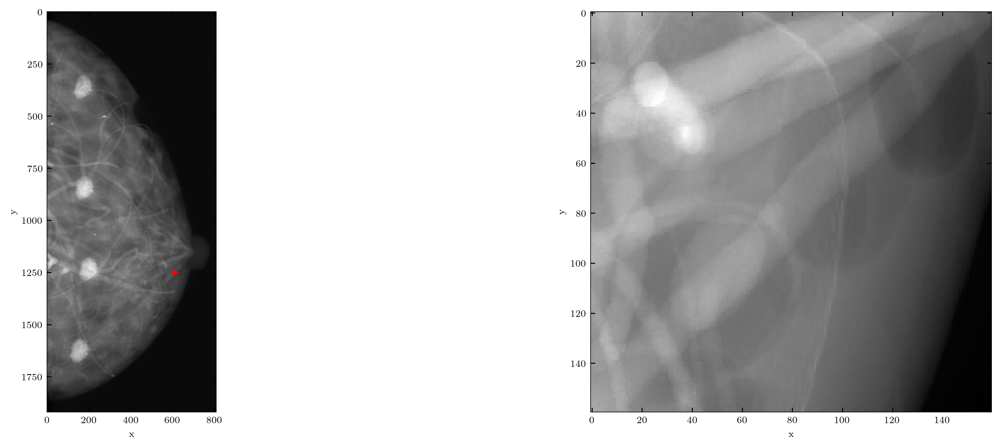

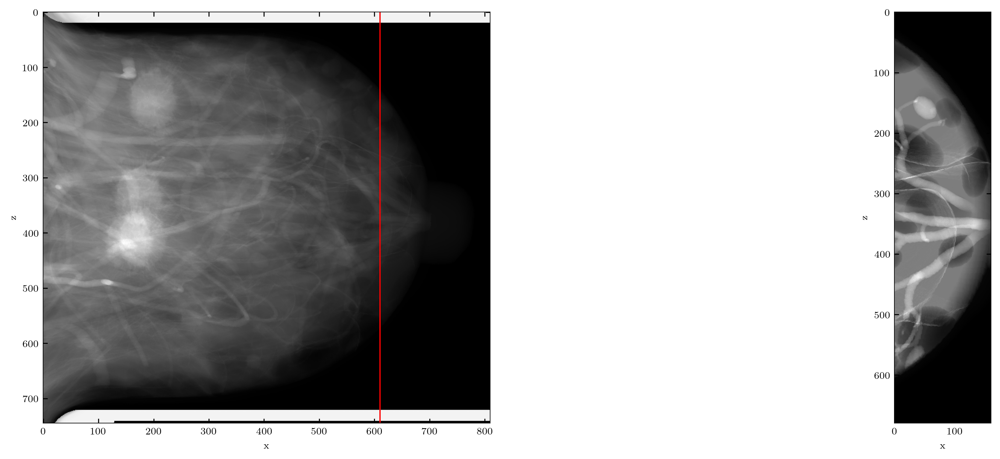

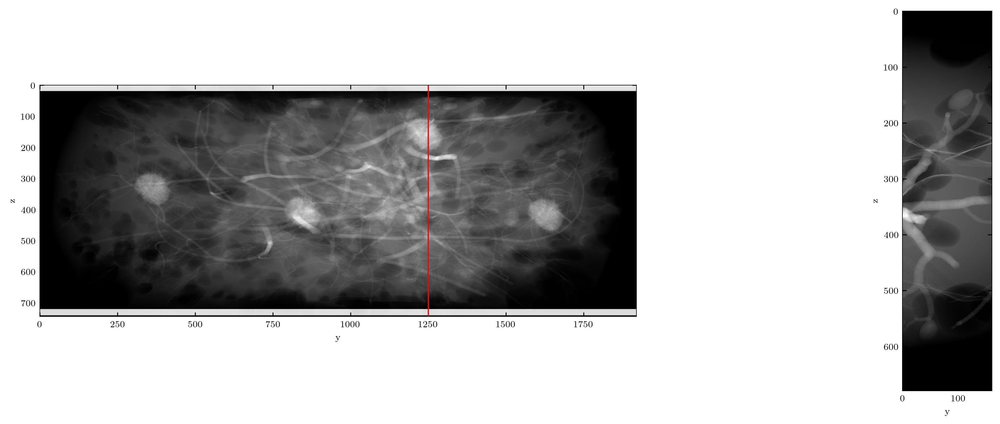

CPU times: user 2.14 s, sys: 332 ms, total: 2.47 s
Wall time: 2.69 s


In [699]:
%%time

# XC, YC = 630, 1150
XC, YC = 610, 1250
cvol = phantom_crop_xy(volume[30:-35], 8e-3, yc=YC, xc=XC)  

print(cvol.shape)

for i in range(3):
    fig, ax = plt.subplots(1, 2, figsize=[15, 5], dpi=300, layout='constrained')
    ax[0].imshow(np.sum(volume, axis=i))
    ax[1].imshow(np.sum(cvol, axis=i))
    for axi in ax.ravel():
        axi.set_xlabel('xxy'[i]); axi.set_ylabel('yzz'[i])
    if i==0:
        ax[0].plot([XC], [YC], 'r+')
    if i==1:
        ax[0].axvline(XC, color='r')
    if i==2:
        ax[0].axvline(YC, color='r')
    plt.show()

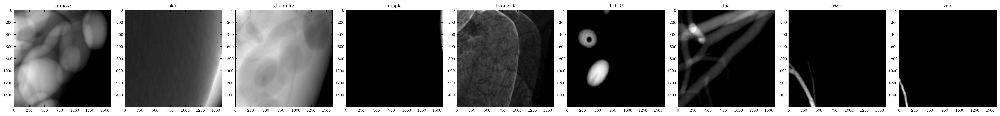

CPU times: user 1min 27s, sys: 4.32 s, total: 1min 32s
Wall time: 1min 32s


In [720]:
%%time

dx_up = 5e-6  

uvol_all = phantom_upsample(cvol, dx_up, matdict=victre_matdict, Nz=1).squeeze()

uvol_materials = [
    victre_matdict[m] for m in victre_matdict if m in np.unique(cvol)[1:]
]

Nm = len(uvol_materials)
fig, ax = plt.subplots(1, Nm, figsize=[3*Nm, 3], layout='constrained')
for i in range(uvol_all.shape[0]):
    ax[i].set_title(uvol_materials[i].name)
    m = ax[i].imshow(1e3 * uvol_all[i])#, cmap='Spectral')
plt.show()


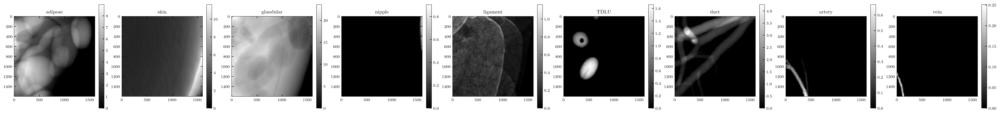

In [732]:
Nm = len(uvol_materials)
fig, ax = plt.subplots(1, Nm, figsize=[3*Nm, 3], layout='constrained')
for i in range(uvol_all.shape[0]):
    ax[i].set_title(uvol_materials[i].name)
    m = ax[i].imshow(1e3 * uvol_all[i])#, cmap='Spectral')
    fig.colorbar(m, ax=ax[i])
plt.show()

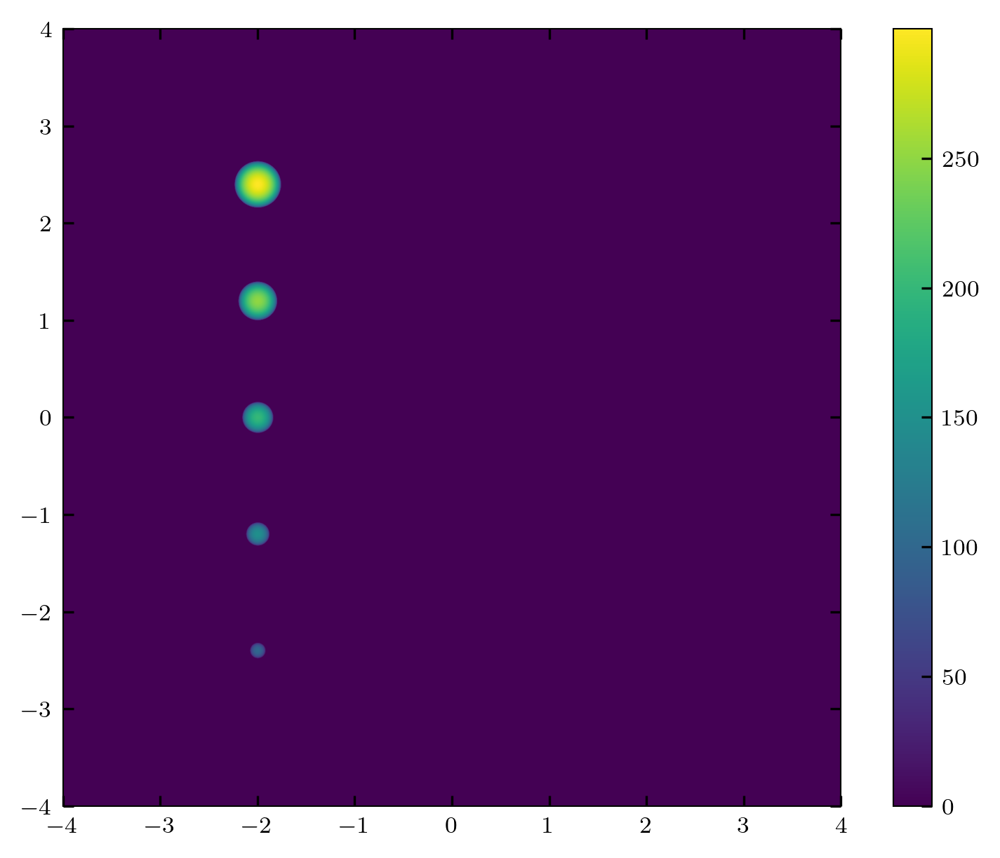

In [771]:
N_sim = uvol_all.shape[-1]
fov_mm = N_sim * 5e-3  # mm

x = jnp.linspace(-1, 1, N_sim)
X, Y = np.meshgrid(x, x)
tmap_calc = ellipsoids_tmap(X, Y, tmax=0.5e-3, N=5, y=-0.25, v=1, h=0.6,
                            a_min=0.2, a_max=0.6).T[:, ::-1]

plt.imshow(1e6*tmap_calc, extent=(-fov_mm/2, fov_mm/2, -fov_mm/2, fov_mm/2),
           cmap='viridis')
plt.colorbar()
plt.show()

victre_tmaps = np.zeros([Nm+1, N_sim, N_sim])
victre_tmaps[:-1] = uvol_all
victre_tmaps[-1] = tmap_calc
victre_tmaps = jnp.array(victre_tmaps)

victre_basis = uvol_materials + [calc2]

In [782]:
victre_tmaps[:2].shape

(2, 1600, 1600)

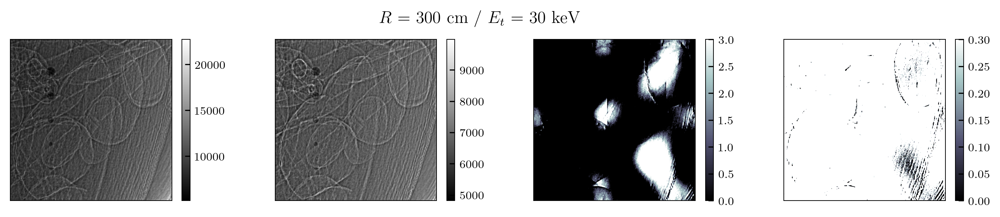

CPU times: user 19.9 s, sys: 6.24 s, total: 26.1 s
Wall time: 6.38 s


In [784]:
%%time

thresh = 30.0
etas = split_spectrum_multi(spectrum[0], thresh, fwhm=5)
etas = etas * eta_det[None,:]

sim_model = SpectralPBI(
    propdist=3,
    spectrum=spectrum,
    etas=etas,
    dx_det=20e-6,
    Nx_det=400,
    param_upsample_factor=4,
    wave_upsample_factor=4,
    init_tmap=victre_tmaps[:2] * 0,  
    mats=(tissue, tissue),  
    psf_fwhm=40e-6,
    I0_total=1e5,    
)
sim_params = sim_model.init(jax.random.PRNGKey(3))
sim_fwd = jax.jit(lambda params: sim_model.apply(params))
data_air = sim_fwd(sim_params)  # Simulate!
I0_bins = data_air[0,0,:]

sim_model = SpectralPBI(
    propdist=3,
    spectrum=spectrum,
    etas=etas,
    dx_det=20e-6,
    Nx_det=400,
    param_upsample_factor=4,
    wave_upsample_factor=4,
    init_tmap=victre_tmaps,   #jnp.array(uvol_all),
    mats=victre_basis,  #uvol_materials,
    psf_fwhm=40e-6,
    I0_total=1e5,    
)

sim_params = sim_model.init(jax.random.PRNGKey(3))
sim_fwd = jax.jit(lambda params: sim_model.apply(params))

data_ideal = sim_fwd(sim_params)  # Simulate!

# data = data_ideal
data = add_noise_to_data(data_ideal, 1.0) # Data!!


######
tie_init, tie_info = schaff_spbi(
    basis_mats = (tissue, bone),
    sim_model = sim_model,  
    data = data / I0_bins[None,None,:], 
    return_info=True
)

######


### Show
fig, ax = plt.subplots(1, 4, figsize=[10,2], layout='constrained')
fig.suptitle(f'$R$ = {sim_model.propdist*1e2:.0f} cm / $E_t$ = {thresh:.0f} keV')
for i in range(2):
    m = ax[i].imshow(data[:,:,i] )
    fig.colorbar(m, ax=ax[i])
    m = ax[2+i].imshow(1e3*tie_init[i], cmap='bone')
    fig.colorbar(m, ax=ax[2+i])
for axi in ax.ravel():
    axi.set_xticks([]); axi.set_yticks([])
plt.show()

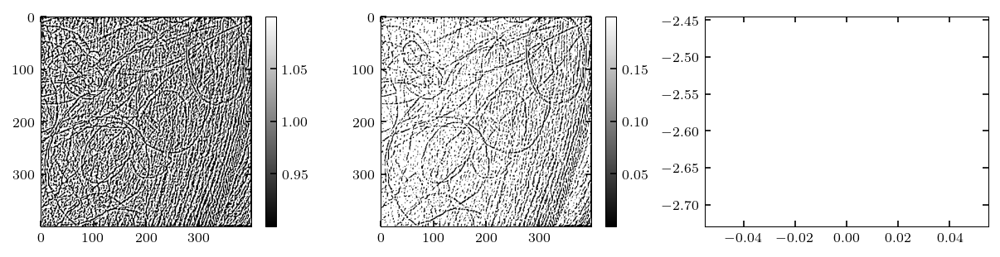

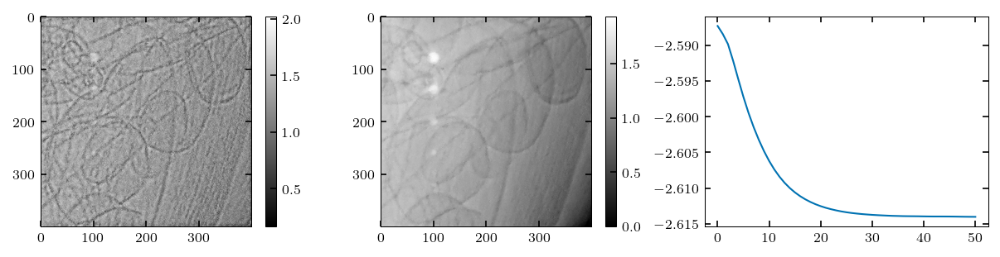

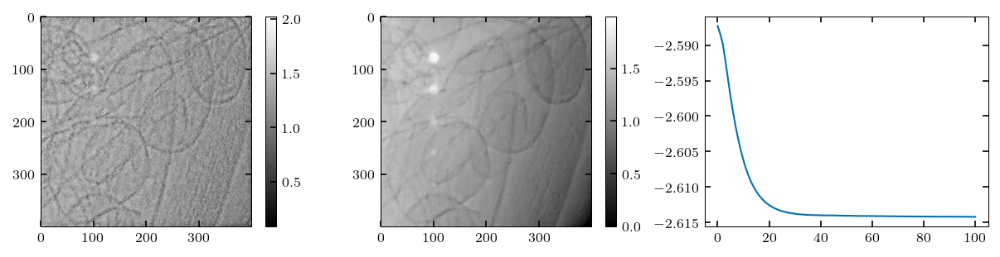

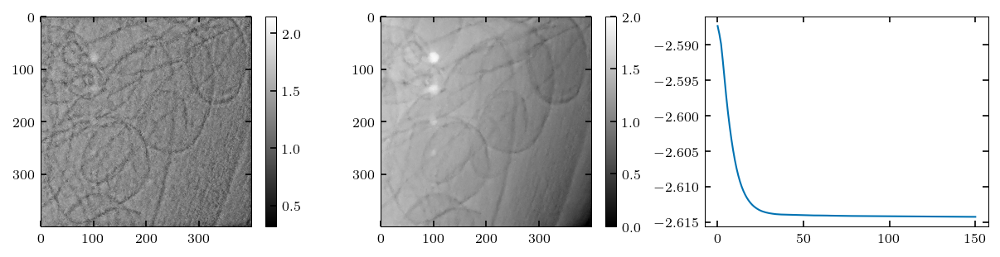

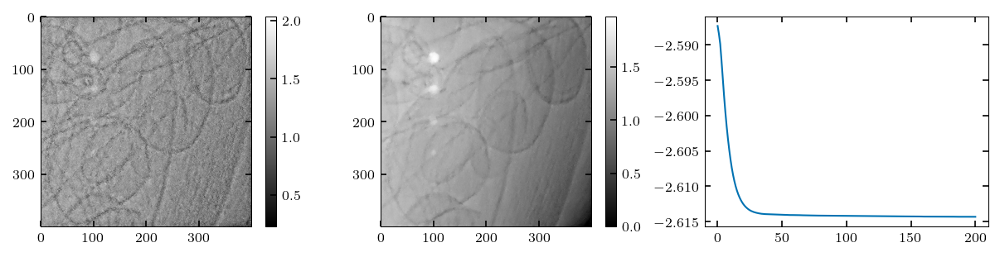

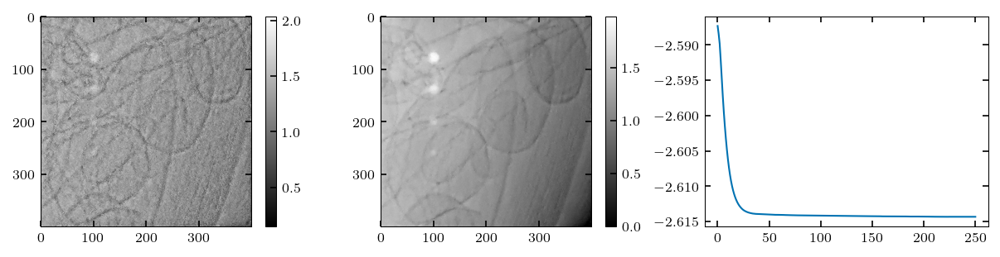

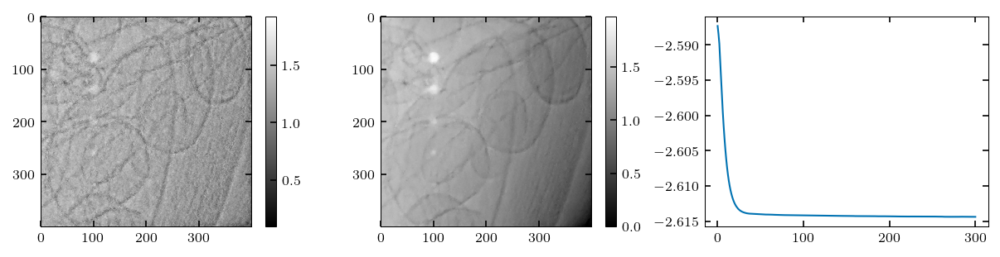

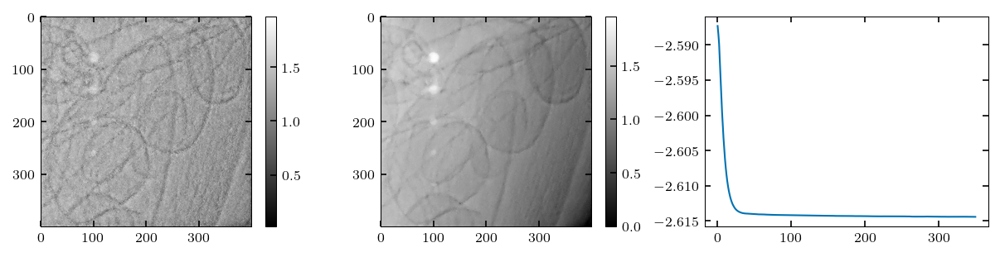

360, time = 49.3 s


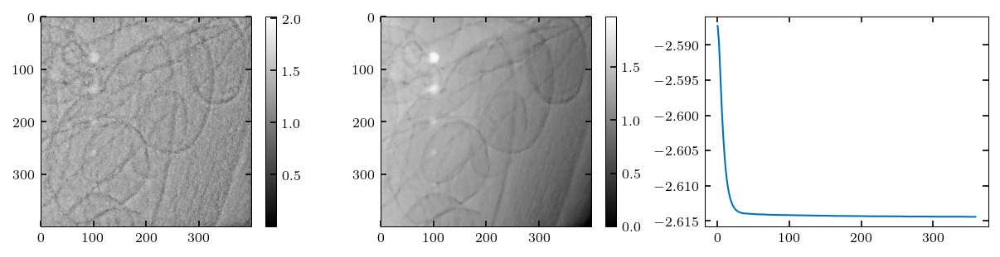

In [797]:
lrate = 1e-4
lam = 2e-2

sh = (sim_model.Nx_det, sim_model.Nx_det)
recon_init = jnp.stack([
    1e-3 * jnp.ones(sh), 
    0.1e-3 * jnp.ones(sh)
])

recon_model = make_mdpr_model_from_sim(
    sim_model,
    mats=(tissue, bone),
    init_tmap=recon_init,
)

recon_fwd = jax.jit(lambda params: recon_model.apply(params))
recon_params = recon_model.init(key)
    
optimizer = optax.chain(
    optax.clip_by_global_norm(1.0),
    optax.adam(lrate),
)

opt_state = optimizer.init(recon_params)
    
def loss_fn(params, data):
    x = params['params']['tmap']
    y = recon_fwd(params)  
    fidelity = calc_nll(y, data) / jnp.sum(I0_bins)
    reg = lam * wtv_8x8_reg(x)
    # reg = lam * tv_reg(x)
    loss = fidelity + reg
    aux = dict(
        loss = loss,
        fidelity = fidelity,
        reg = reg
    )
    return loss, aux

@jax.jit
def train_step(params, opt_state, data):
    (loss, aux), grads = jax.value_and_grad(loss_fn, has_aux=True)(params, data)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    params = clip_params(params)
    return params, opt_state, aux

#############################################
# Run optimize:
    
it = 0
loss_hist = []
t0 = time.time()
while keep_iterating(loss_hist, max_hist=1000, w=50, thresh=1e-5):
    recon_params, opt_state, aux = train_step(recon_params, opt_state, data,)
    loss_hist.append(aux['loss'])   
    if (it%50 == 0):
        imshow_params(recon_params, loss_hist, tmax=None)
    it += 1
print(f'{it}, time = {time.time() - t0:.1f} s')

imshow_params(recon_params, loss_hist, tmax=None)


20


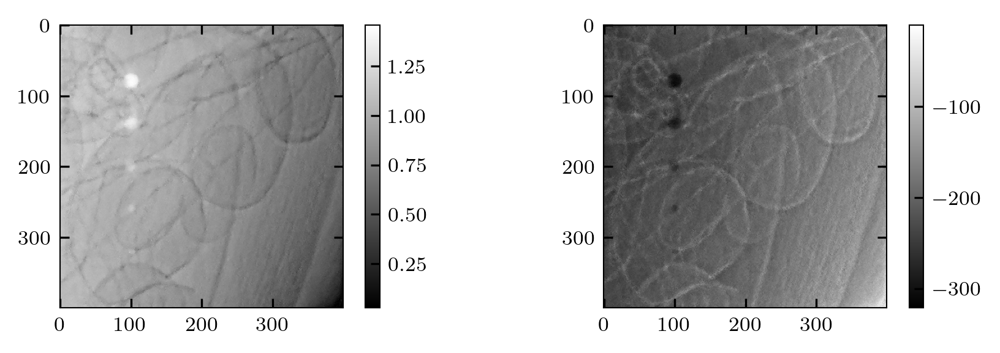

50


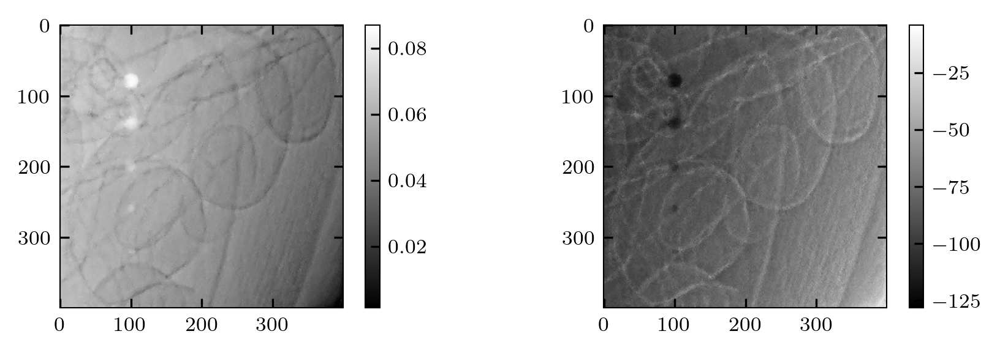

80


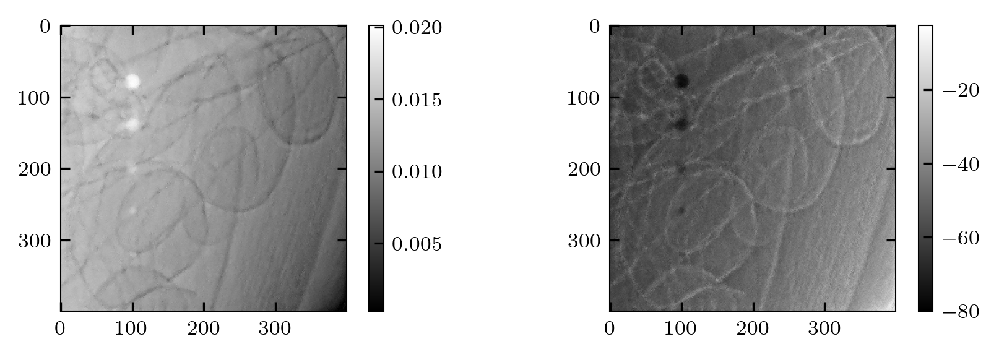

110


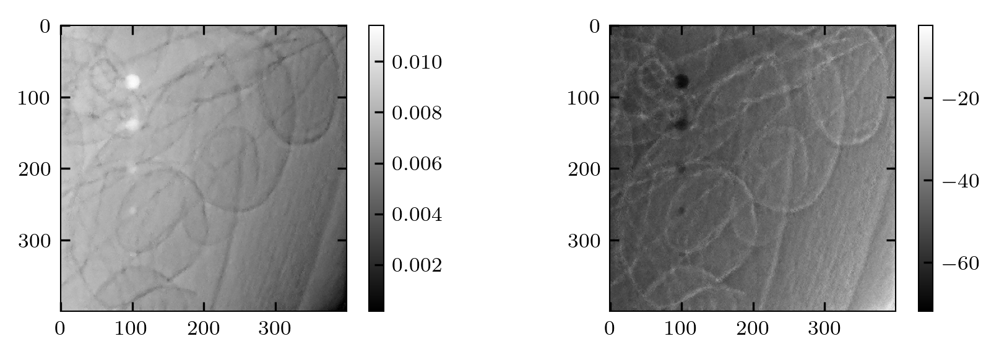

140


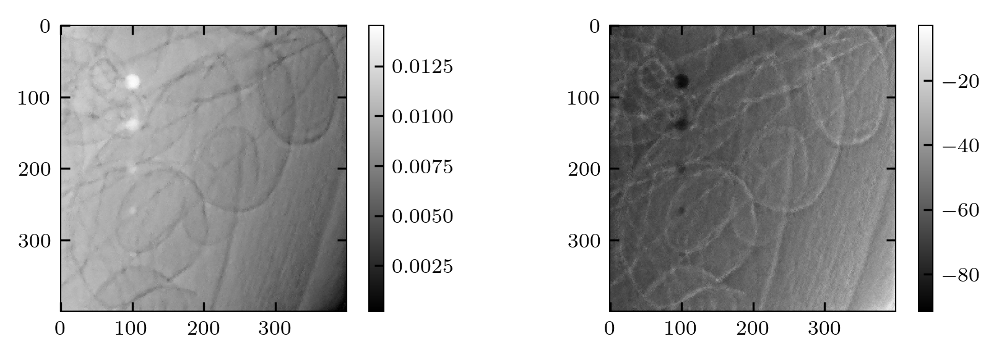

170


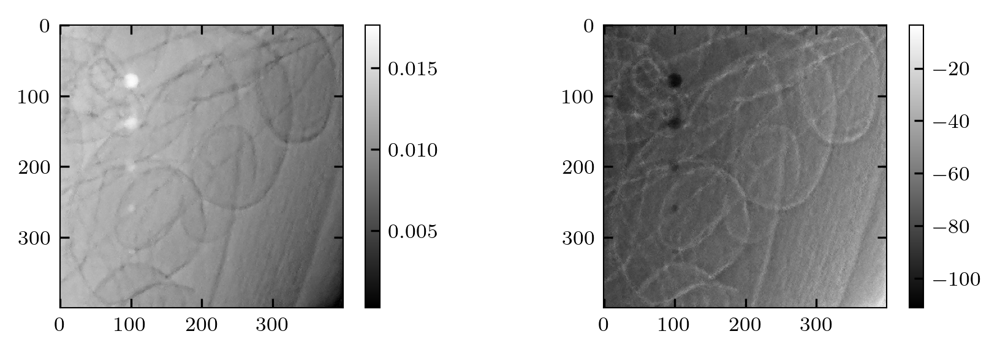

In [818]:
tmaps_est = recon_params['params']['tmap']

def make_vmi(E, ims, basis, contrast='mu'):
    d1, b1 = basis[0].delta_beta(E)    
    d2, b2 = basis[1].delta_beta(E)

    k = get_wavenum(E)
    
    vmi_abs = 2 * k * (b1 * ims[0] + b2 * ims[1])
    vmi_phase = -k * (d1 * ims[0] + d2 * ims[1])

    return np.array([vmi_abs, vmi_phase])

for E in np.arange(20, 200, 30):
    print(E)
    vmis = make_vmi(E, tmaps_est, basis_recon)
    
    fig, ax = plt.subplots(1, 2, figsize=[7,2])
    for i in range(2):
        m = ax[i].imshow(vmis[i])
        fig.colorbar(m, ax=ax[i])
    plt.show()